In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os

In [2]:
train_root = "./data/train/"
upsampling_root = "./upsampling/"
os.makedirs(upsampling_root, exist_ok=True)

In [3]:
train_df = pd.read_csv("./data/train.csv")

In [4]:
count = train_df['Id'].value_counts()
train_df['count'] = train_df['Id'].apply(lambda x: count[x])

In [5]:
train_df.head()

,Image,Id,count
0,0000e88ab.jpg,w_f48451c,14
1,0001f9222.jpg,w_c3d896a,4
2,00029d126.jpg,w_20df2c5,4
3,00050a15a.jpg,new_whale,9664
4,0005c1ef8.jpg,new_whale,9664


In [6]:
from albumentations import *
import imgaug as ia

In [7]:
def train_aug(scale, shear, p=1.0):
    return Compose([
        IAAAffine(
            scale=(scale, scale),
            shear=(shear, shear), 
            mode=ia.ALL, 
            p=1
        )
    ], p=p)

In [8]:
need_to_up_df = train_df[train_df["count"] < 4]

In [9]:
need_to_up_df["Id"].nunique()

3926

In [10]:
scales = [1.0, 1.2]
shears = [-30, 30, -20, 20, -10, 10]

In [11]:
augs = [(1.0, -30), (1.0, 30), (1.0, -20), (1.0, 20), (1.2, -30), (1.2, 30), (1.2, -20), (1.2, 20), (1.2, 10), (1.2, -10), (1.0, -10), (1.0, 10)]

In [12]:
from tqdm import *

In [13]:
upsampling_images = []
upsampling_ids = []

for id in tqdm(need_to_up_df["Id"].unique()):
    tmp_df = need_to_up_df[need_to_up_df["Id"] == id]
    all_images = tmp_df["Image"].values
    n_upsampling = 4 - len(all_images)
    count = 0
    if n_upsampling > len(all_images):
        rnd_images = np.random.choice(all_images, n_upsampling, replace=True)
    else:
        rnd_images = np.random.choice(all_images, n_upsampling, replace=False)
    for i, sample_image in enumerate(rnd_images):
        splits = sample_image.split(".")
        
        aug_param = augs[i]
        upsampling_aug = train_aug(scale=aug_param[0], shear=aug_param[1])
        
        sample_image = train_root + sample_image
        sample_image = cv2.imread(sample_image)
        sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

        transform_image = upsampling_aug(image=sample_image)["image"]
        
        image_name = splits[0]
        image_name = f"{image_name}_{i}" + "." + splits[1]
        
        upsampling_images.append(image_name)
        upsampling_ids.append(id)
        
        upsampling_img = os.path.join(upsampling_root, image_name)
        
        cv2.imwrite(upsampling_img, transform_image)

100%|██████████| 3926/3926 [03:36<00:00, 18.17it/s]


In [14]:
up_df = pd.DataFrame({
    "Image": upsampling_images,
    "Id": upsampling_ids
})

In [15]:
up_df.shape

(9357, 2)

In [16]:
train_df = pd.read_csv("./data/train.csv")

In [17]:
train_df.shape

(25361, 2)

In [18]:
train_df["is_upsampling"] = False
up_df["is_upsampling"] = True

In [19]:
train_df = pd.concat([train_df, up_df], axis=0)

In [20]:
train_df.to_csv("train_up_df.csv", index=False)

In [21]:
count = train_df['Id'].value_counts()
train_df['count'] = train_df['Id'].apply(lambda x: count[x])

In [22]:
train_df.head()

,Image,Id,is_upsampling,count
0,0000e88ab.jpg,w_f48451c,False,14
1,0001f9222.jpg,w_c3d896a,False,4
2,00029d126.jpg,w_20df2c5,False,4
3,00050a15a.jpg,new_whale,False,9664
4,0005c1ef8.jpg,new_whale,False,9664


In [23]:
hm_train = train_df[((train_df['count'] >= 2) & (train_df['Id'] != "new_whale"))]

In [24]:
scales = [1.0, 1.2]
shears = [-30, -20, -10, 10, 20, 30]

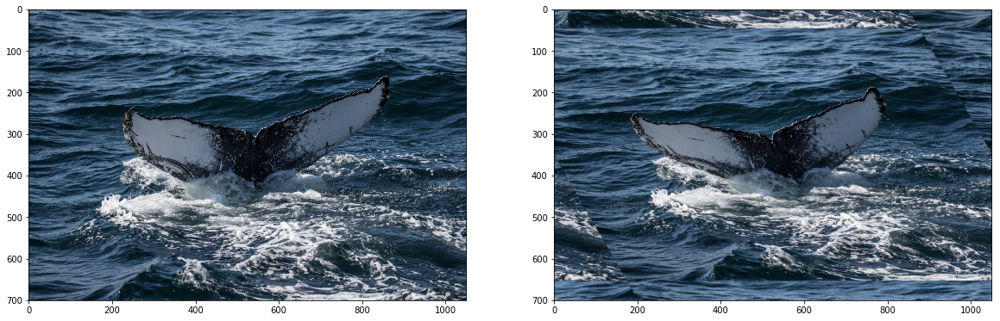

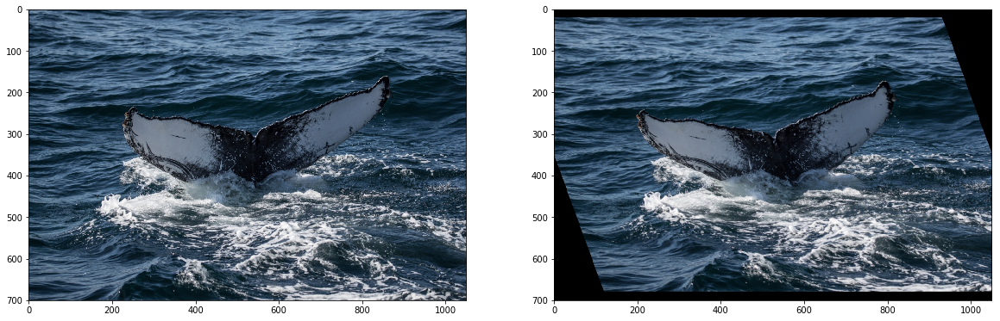

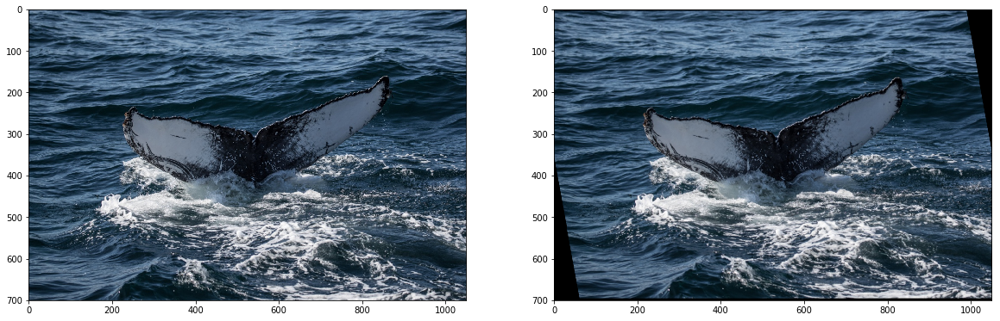

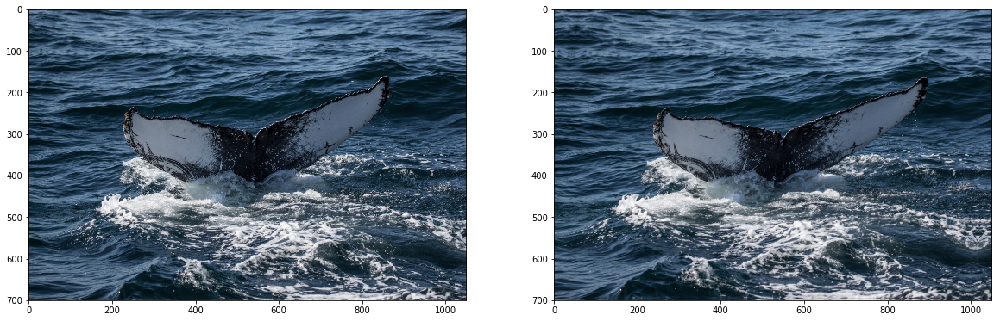

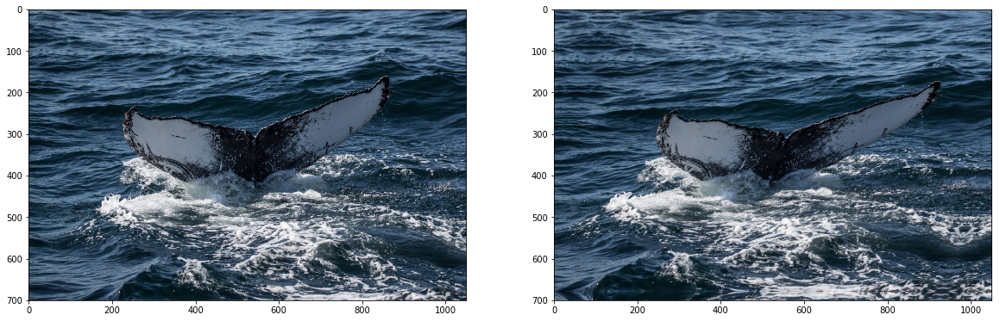

...

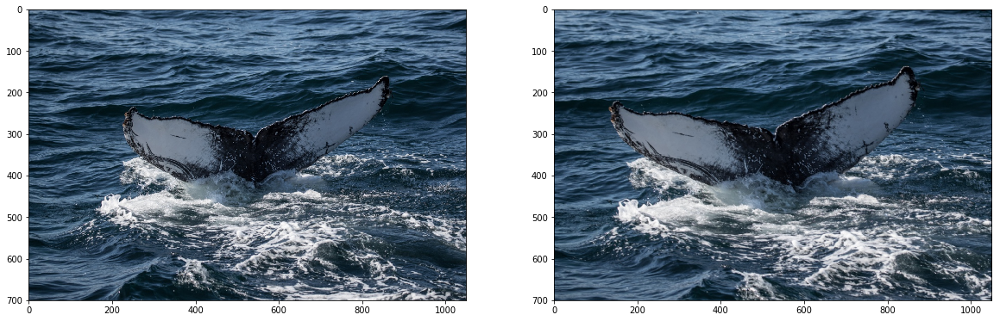

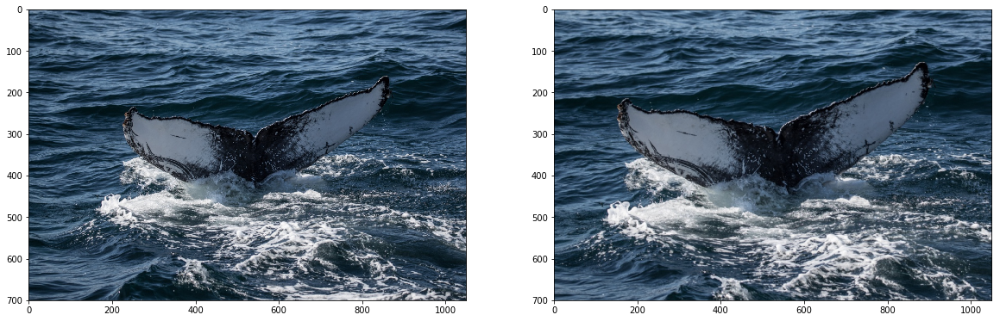

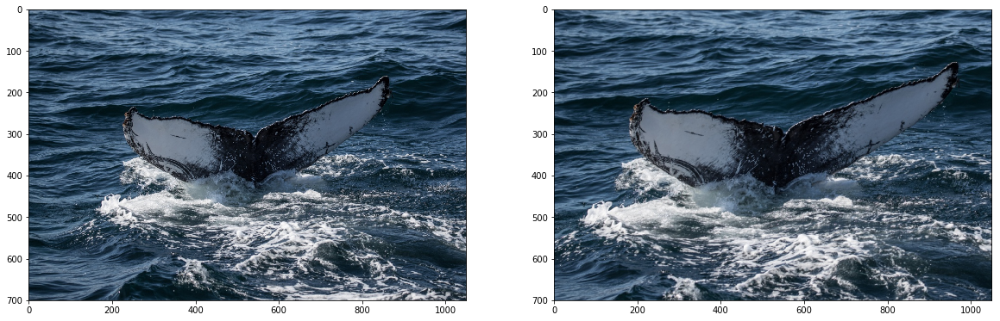

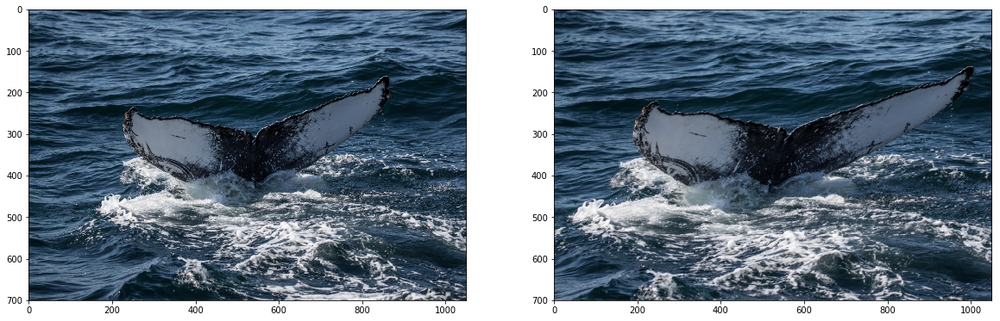

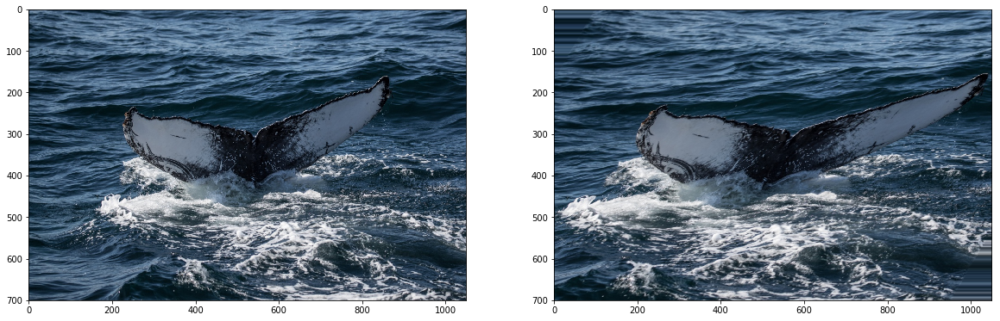

In [25]:
for scale in scales:
    for shear in shears:
        upsampling_aug = train_aug(scale=scale, shear=shear)

        sample_image = "0000e88ab.jpg"
        sample_image = train_root + sample_image
        sample_image = cv2.imread(sample_image)
        sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

        transform_image = upsampling_aug(image=sample_image)["image"]

        _, ax = plt.subplots(ncols=2, nrows=1, figsize=(20, 20))

        ax[0].imshow(sample_image)
        ax[1].imshow(transform_image)

        plt.show()